In [1]:
import os
import math
import numpy as np
import tensorflow as tf

from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from glob import glob

from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *

## 데이터 로드 및 전처리

In [2]:
from albumentations import  HorizontalFlip, RandomSizedCrop, Compose, OneOf, Resize

def build_augmentation(is_train=True):
    if is_train:    # 훈련용 데이터일 경우
        return Compose([
                        HorizontalFlip(p=0.5),    # 50%의 확률로 좌우대칭
                        RandomSizedCrop(         # 50%의 확률로 RandomSizedCrop
                            min_max_height=(300, 370),
                            w2h_ratio=370/1242,
                            height=224,
                            width=224,
                            p=0.5
                            ),
                        Resize(              # 입력이미지를 224X224로 resize
                            width=224,
                            height=224
                            )
                        ])
        return Compose([      # 테스트용 데이터일 경우에는 224X224로 resize만 수행합니다. 
                        Resize(
                            width=224,
                            height=224
                            )
                        ])

In [3]:
dir_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/data/training'

augmentation_train = build_augmentation()
augmentation_test = build_augmentation(is_train=False)
input_images = glob(os.path.join(dir_path, "image_2", "*.png"))

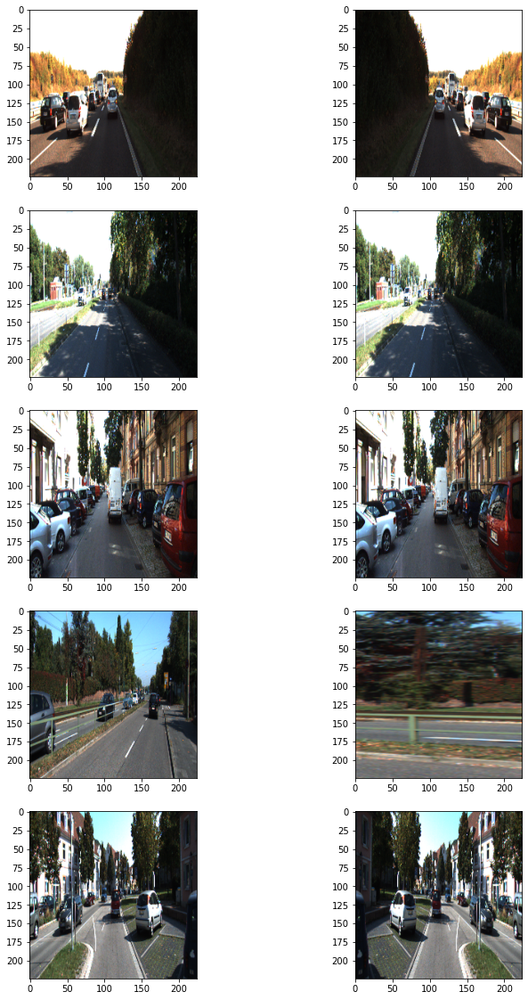

In [4]:
# 훈련 데이터셋에서 5개만 가져와 augmentation을 적용해 봅시다.  
plt.figure(figsize=(12, 20))
for i in range(5):
    image = imread(input_images[i]) 
    image_data = {"image":image}
    resized = augmentation_test(**image_data)
    processed = augmentation_train(**image_data)
    plt.subplot(5, 2, 2*i+1)
    plt.imshow(resized["image"])  # 왼쪽이 원본이미지
    plt.subplot(5, 2, 2*i+2)
    plt.imshow(processed["image"])  # 오른쪽이 augment된 이미지
  
plt.show()

In [6]:
class KittiGenerator(tf.keras.utils.Sequence):
    '''
    KittiGenerator는 tf.keras.utils.Sequence를 상속받습니다.
    우리가 KittiDataset을 원하는 방식으로 preprocess하기 위해서 Sequnce를 커스텀해 사용합니다.
    '''
    def __init__(self, 
               dir_path,
               batch_size=16,
               img_size=(224, 224, 3),
               output_size=(224, 224),
               is_train=True,
               augmentation=None):
        '''
        dir_path: dataset의 directory path입니다.
        batch_size: batch_size입니다.
        img_size: preprocess에 사용할 입력이미지의 크기입니다.
        output_size: ground_truth를 만들어주기 위한 크기입니다.
        is_train: 이 Generator가 학습용인지 테스트용인지 구분합니다.
        augmentation: 적용하길 원하는 augmentation 함수를 인자로 받습니다.
        '''
        self.dir_path = dir_path
        self.batch_size = batch_size
        self.is_train = is_train
        self.dir_path = dir_path
        self.augmentation = augmentation
        self.img_size = img_size
        self.output_size = output_size

        # load_dataset()을 통해서 kitti dataset의 directory path에서 라벨과 이미지를 확인합니다.
        self.data = self.load_dataset()

    def load_dataset(self):
        # kitti dataset에서 필요한 정보(이미지 경로 및 라벨)를 directory에서 확인하고 로드하는 함수입니다.
        # 이때 is_train에 따라 test set을 분리해서 load하도록 해야합니다.
        input_images = glob(os.path.join(self.dir_path, "image_2", "*.png"))
        label_images = glob(os.path.join(self.dir_path, "semantic", "*.png"))
        input_images.sort()
        label_images.sort()
        assert len(input_images) == len(label_images)
        data = [ _ for _ in zip(input_images, label_images)]

        if self.is_train:
            return data[:-30]
        return data[-30:]

    def __len__(self):
    # Generator의 length로서 전체 dataset을 batch_size로 나누고 소숫점 첫째자리에서 올림한 값을 반환합니다.
        return math.ceil(len(self.data) / self.batch_size)

    def __getitem__(self, index):
    # 입력과 출력을 만듭니다.
    # 입력은 resize및 augmentation이 적용된 input image이고 
    # 출력은 semantic label입니다.
        batch_data = self.data[
                               index*self.batch_size:
                               (index + 1)*self.batch_size
                               ]
        inputs = np.zeros([self.batch_size, *self.img_size])
        outputs = np.zeros([self.batch_size, *self.output_size])

        for i, data in enumerate(batch_data):
            input_img_path, output_path = data
            _input = imread(input_img_path)
            _output = imread(output_path)
            _output = (_output==7).astype(np.uint8)*1
            data = {
                  "image": _input,
                  "mask": _output,
                  }
            augmented = self.augmentation(**data)
            inputs[i] = augmented["image"]/255
            outputs[i] = augmented["mask"]
            return inputs, outputs

    def on_epoch_end(self):
        # 한 epoch가 끝나면 실행되는 함수입니다. 학습중인 경우에 순서를 random shuffle하도록 적용한 것을 볼 수 있습니다.
        self.indexes = np.arange(len(self.data))
        if self.is_train == True :
            np.random.shuffle(self.indexes)
            return self.indexes

In [7]:
augmentation = build_augmentation()
test_preproc = build_augmentation(is_train=False)
        
train_generator = KittiGenerator(
    dir_path, 
    augmentation=augmentation,
)

test_generator = KittiGenerator(
    dir_path, 
    augmentation=test_preproc,
    is_train=False
)

## UNet 설계 및 훈련

In [8]:
def encoder_block(x, fillter_n, max_pooling=True):
    enc = Conv2D(fillter_n, 3, padding='same')(x)
    enc_batch = BatchNormalization()(enc)
    enc_act = tf.keras.activations.relu(enc_batch)
    
    enc = Conv2D(fillter_n, 3, padding='same')(enc_act)
    enc_batch = BatchNormalization()(enc)
    enc_act = tf.keras.activations.relu(enc_batch)

    if max_pooling:
        pool = MaxPooling2D(pool_size=2)(enc_act)
        return pool, enc_act
    return enc_act

def decoder_block(x, skip_conn, fillter_n):
    dec = Conv2DTranspose(fillter_n,2,strides=2,padding='same')(x)
    
    conn = concatenate([dec, skip_conn], axis=3)

    dec = encoder_block(conn, fillter_n, max_pooling=False)
    return dec

def build_model(input_shape=(224, 224, 3)):
    inputs = Input(input_shape)  

    # Encoder
    enc_1, skip_conn_1 = encoder_block(inputs, 64)
    enc_2, skip_conn_2 = encoder_block(enc_1, 128)
    enc_3, skip_conn_3 = encoder_block(enc_2, 256)
    enc_4, skip_conn_4 = encoder_block(enc_3, 512)
    enc_5 = encoder_block(enc_4, 1024, max_pooling=False)
    # Decoder
    dec_1 = decoder_block(enc_5, skip_conn_4, 512)
    dec_2 = decoder_block(dec_1, skip_conn_3, 256)
    dec_3 = decoder_block(dec_2, skip_conn_2, 128)
    dec_4 = decoder_block(dec_3, skip_conn_1, 64)

    outputs = Conv2D(1, 1, padding='same', activation='sigmoid')(dec_4)
    
    model = tf.keras.Model(inputs=inputs, outputs=outputs) 
    return model

model = build_model()
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 224, 224, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 224, 224, 64) 256         conv2d[0][0]                     
__________________________________________________________________________________________________
tf.nn.relu (TFOpLambda)         (None, 224, 224, 64) 0           batch_normalization[0][0]        
______________________________________________________________________________________________

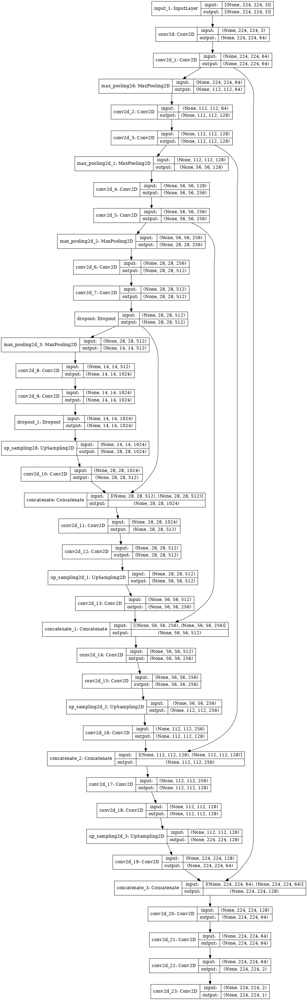

In [16]:
tf.keras.utils.plot_model(model, show_shapes=True, dpi=64)

In [10]:
is_train = False

if is_train:
    model_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/seg_model_unet.h5'
    model = build_model()
    model.compile(optimizer = Adam(1e-4), loss = 'binary_crossentropy')
    model.fit(
         train_generator,
         validation_data=test_generator,
         steps_per_epoch=len(train_generator),
         epochs=100,
     )

    model.save(model_path) 
else:
    model_path = dir_path + '/seg_model_unet.h5' 
    
    model = tf.keras.models.load_model(model_path)

## IoU 계산 및 시각화

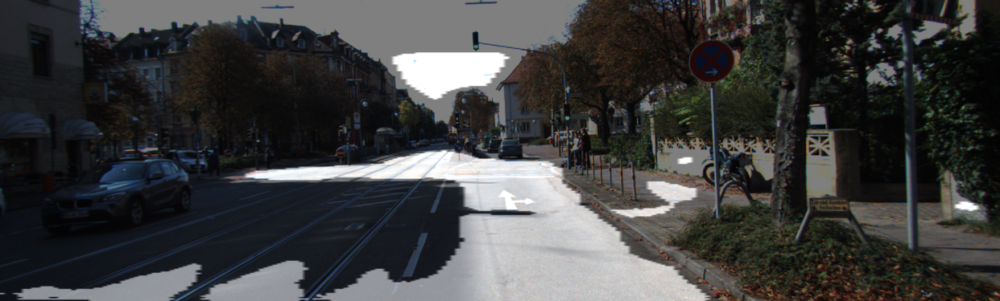

IoU : 0.419641


0.41964089410040306

In [14]:
def calculate_iou_score(target, prediction):
    intersection = target * prediction
    union = (target + prediction) - intersection
    iou_score = float(intersection.sum() / union.sum())
    print('IoU : %f' % iou_score )
    return iou_score

def get_output(model, preproc, image_path, output_path, label_path):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    processed = preproc(**data)
    output = model(np.expand_dims(processed["image"]/255,axis=0))
    output = (output[0].numpy()>=0.5).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가 달라집니다.
    prediction = output/255   # 도로로 판단한 영역
    
    output = Image.fromarray(output)
    background = Image.fromarray(origin_img).convert('RGBA')
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    output = Image.blend(background, output, alpha=0.5)
    output.show()   # 도로로 판단한 영역을 시각화!
     
    if label_path:   
        label_img = imread(label_path)
        label_data = {"image":label_img}
        label_processed = preproc(**label_data)
        label_processed = label_processed["image"]
        target = (label_processed == 7).astype(np.uint8)*1   # 라벨에서 도로로 기재된 영역

        return output, prediction, target
    else:
        return output, prediction, _
    
    
i = 1    # i값을 바꾸면 테스트용 파일이 달라집니다. 
output, prediction, target = get_output(
     model, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

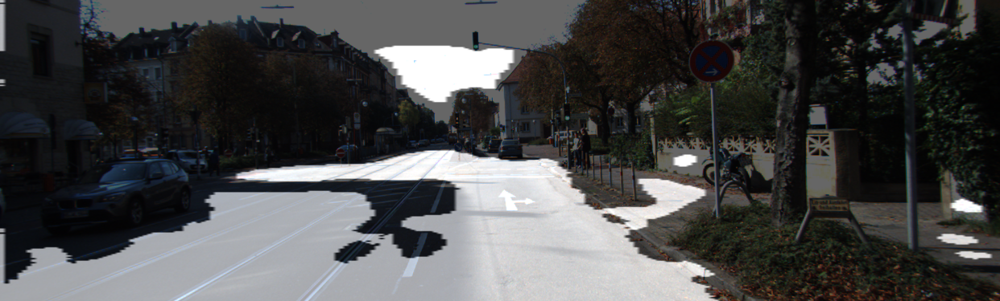

IoU : 0.711784


0.7117839949766274

In [59]:
output, prediction, target = get_output(
     model, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

어느정도 인식은 하지만, 하늘은 인식하거나(FP), 상대적으로 어두운 도로는 인식하지 못하고 있습니다(TN).   
threshold를 0.5(위)에서 0.3(아래)으로 변경하니 IoU가 증가함과 동시에 도로인식이 더 잘 되었습니다.

## UNet++ 설계

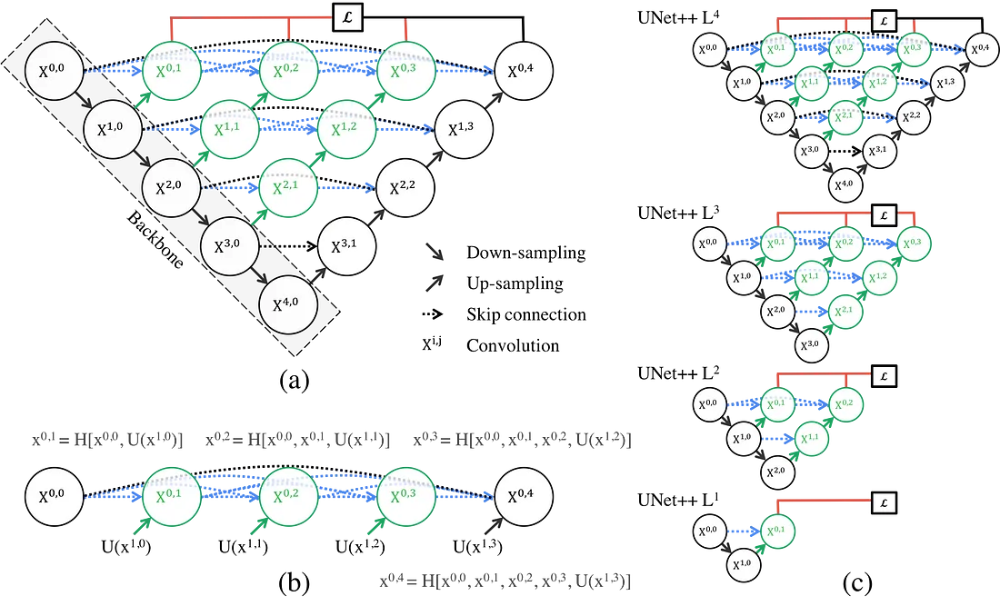

UNet++ differs from the original U-Net
in three ways: 1) having convolution layers on skip pathways (shown in green),
which bridges the semantic gap between encoder and decoder feature maps; 2)
having dense skip connections on skip pathways (shown in blue), which improves
gradient flow; and 3) having deep supervision (shown in red)

In [32]:
#Convolution encoder: conv, batch, ReLU, maxpool(option)
def encoder_block(x, fillter_n, max_pooling=False):
    enc = Conv2D(fillter_n, 3, padding='same')(x)
    enc = BatchNormalization()(enc)
    enc = tf.keras.activations.relu(enc)
    
    enc = Conv2D(fillter_n, 3, padding='same')(enc)
    enc = BatchNormalization()(enc)
    enc = tf.keras.activations.relu(enc)

    if max_pooling:
        pool = MaxPooling2D(pool_size=2)(enc)
        return enc, pool
    return enc

def build_model2(input_shape=(224, 224, 3)):
    inputs = Input(input_shape)  
    
    #down-sampling
    x0_0, dx0_0 = encoder_block(inputs, 64, max_pooling=True)
    x1_0, dx1_0 = encoder_block(dx0_0, 128, max_pooling=True)
    x2_0, dx2_0 = encoder_block(dx1_0, 256, max_pooling=True)
    x3_0, dx3_0 = encoder_block(dx2_0, 512, max_pooling=True)
    x4_0 = encoder_block(dx3_0, 1024, max_pooling=False)
    
    #nested skip connection & up-sampling
    #L1 : x1_0 > x0_1 > output1
    ux1_0 = UpSampling2D(2)(x1_0)
    x0_1 = concatenate([x0_0, ux1_0], axis=3)
    x0_1 = encoder_block(x0_1, 64)
    
    output1 = Conv2D(1, 1, padding='same', activation='sigmoid')(x0_1)
    
    #L2 : x2_0 > x1_1 > x0_2 > output2
    ux2_0 = UpSampling2D(2)(x2_0)
    x1_1 = concatenate([x1_0, ux2_0], axis=3)
    x1_1 = encoder_block(x1_1, 128)
    
    ux1_1 = UpSampling2D(2)(x1_1)
    x0_2 = concatenate([x0_0, x0_1, ux1_1], axis=3)
    x0_2 = encoder_block(x0_2, 64)
    
    output2 = Conv2D(1, 1, padding='same', activation='sigmoid')(x0_2)
    
    #L3 : x3_0 > x2_1 > x1_2 > x0_3 > output3
    ux3_0 = UpSampling2D(2)(x3_0)
    x2_1 = concatenate([x2_0, ux3_0], axis=3)
    x2_1 = encoder_block(x2_1, 256)
    
    ux2_1 = UpSampling2D(2)(x2_1)
    x1_2 = concatenate([x1_0, x1_1, ux2_1], axis=3)
    x1_2 = encoder_block(x1_2, 128)
    
    ux1_2 = UpSampling2D(2)(x1_2)
    cx0_3 = concatenate([x0_0, x0_1, x0_2, ux1_2], axis=3)
    x0_3 = encoder_block(cx0_3, 64)
    
    output3 = Conv2D(1, 1, padding='same', activation='sigmoid')(x0_3)
    
    #L4 : x4_0 > x3_1 > x2_2 > x1_3 > x0_4 > output4
    ux4_0 = UpSampling2D(2)(x4_0)
    cx3_1 = concatenate([x3_0, ux4_0], axis=3)
    x3_1 = encoder_block(cx3_1, 512)
    
    ux3_1 = UpSampling2D(2)(x3_1)
    cx2_2 = concatenate([x2_0, x2_1, ux3_1], axis=3)
    x2_2 = encoder_block(cx2_2, 256)
    
    ux2_2 = UpSampling2D(2)(x2_2)
    cx1_3 = concatenate([x1_0, x1_1, x1_2, ux2_2], axis=3)
    x1_3 = encoder_block(cx1_3, 128)
    
    ux1_3 = UpSampling2D(2)(x1_3)
    cx0_4 = concatenate([x0_0, x0_1, x0_2, x0_3, ux1_3], axis=3)
    x0_4 = encoder_block(cx0_4, 128)
    
    output4 = Conv2D(1, 1, padding='same', activation='sigmoid')(x0_4)
    
    #outputs  
    outputs = (output1 + output2 + output3 + output4) / 4
            
    model = tf.keras.Model(inputs=inputs, outputs=outputs) 
    return model

model2 = build_model2()
model2.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_90 (Conv2D)              (None, 224, 224, 64) 1792        input_9[0][0]                    
__________________________________________________________________________________________________
batch_normalization_88 (BatchNo (None, 224, 224, 64) 256         conv2d_90[0][0]                  
__________________________________________________________________________________________________
tf.nn.relu_88 (TFOpLambda)      (None, 224, 224, 64) 0           batch_normalization_88[0][0]     
____________________________________________________________________________________________

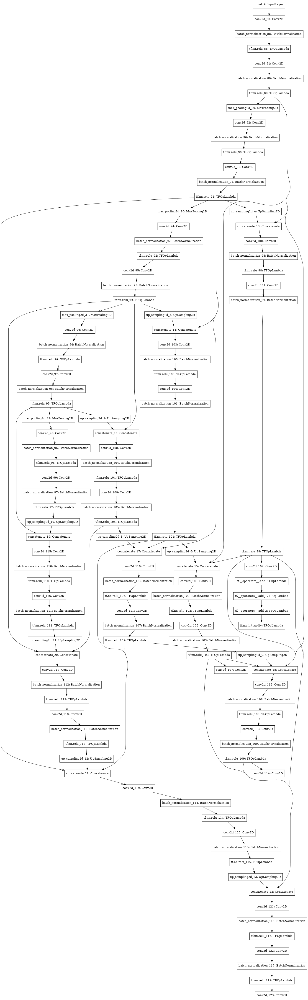

In [34]:
tf.keras.utils.plot_model(model2, show_shapes=False, dpi=64)

## Loss 정의(binary cross-entropy and dice coefficient )

In [38]:
from keras import backend as K
#dice loss
def dice_coef(y_true, y_pred): #TP에 더 가중치 부여
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def bce_dice_loss(y_true, y_pred):
    return 0.5 * tf.keras.losses.binary_crossentropy(y_true, y_pred) - dice_coef(y_true, y_pred)

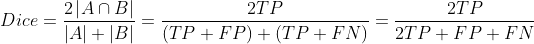

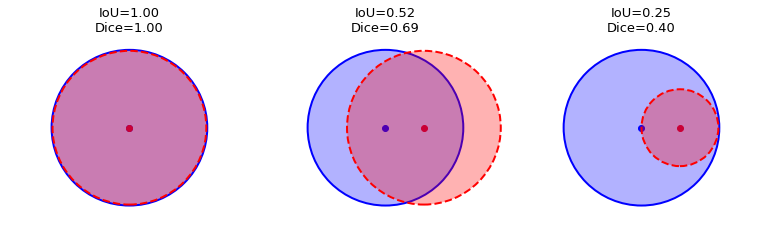

## UNet++ 훈련

In [39]:
train_generator = KittiGenerator(
    dir_path, 
    augmentation=augmentation,
    batch_size=6
)
test_generator = KittiGenerator(
    dir_path, 
    augmentation=test_preproc,
    batch_size=6,
    is_train=False
)

is_train = True
if is_train:
    model2_path = os.getenv('HOME')+'/aiffel/aiffel/semantic_segmentation/assets'

    model2.compile(optimizer="Adam", 
              loss=bce_dice_loss, 
              metrics=["binary_crossentropy", dice_coef])
    
    model2.fit(
         train_generator,
         validation_data=test_generator,
         steps_per_epoch=len(train_generator),
         epochs=100
     )

    model2.save(model_path)
else:
    model2_path = os.getenv('HOME')+'/aiffel/aiffel/semantic_segmentation/assets'
    model2 = tf.keras.models.load_model(model_path)

Epoch 1/100
29/29 [==============================] - 43s 915ms/step - loss: -0.0223 - binary_crossentropy: 0.3027 - dice_coef: 0.1737 - val_loss: 0.0515 - val_binary_crossentropy: 0.2782 - val_dice_coef: 0.0876
Epoch 2/100
29/29 [==============================] - 26s 900ms/step - loss: -0.2450 - binary_crossentropy: 0.1840 - dice_coef: 0.3370 - val_loss: 0.0861 - val_binary_crossentropy: 0.3323 - val_dice_coef: 0.0800
Epoch 3/100
29/29 [==============================] - 26s 911ms/step - loss: -0.2051 - binary_crossentropy: 0.1447 - dice_coef: 0.2774 - val_loss: 0.0847 - val_binary_crossentropy: 0.3372 - val_dice_coef: 0.0839
Epoch 4/100
29/29 [==============================] - 27s 921ms/step - loss: -0.3294 - binary_crossentropy: 0.1245 - dice_coef: 0.3916 - val_loss: 0.0914 - val_binary_crossentropy: 0.3619 - val_dice_coef: 0.0895
Epoch 5/100
29/29 [==============================] - 27s 927ms/step - loss: -0.3168 - binary_crossentropy: 0.1096 - dice_coef: 0.3716 - val_loss: 0.0891 - v

OSError: Unable to create file (unable to open file: name = '/aiffel/aiffel/semantic_segmentation/data/training/seg_model_unet.h5', errno = 30, error message = 'Read-only file system', flags = 13, o_flags = 242)

In [42]:
model2.save(os.getenv('HOME')+'/aiffel/semantic_segmentation/')

INFO:tensorflow:Assets written to: /aiffel/aiffel/semantic_segmentation/assets


## UNet, UNet++ 결과 시각화 및 비교

In [61]:
def get_output(model, preproc, image_path, output_path, label_path):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    processed = preproc(**data)
    output = model(np.expand_dims(processed["image"]/255,axis=0))
    output = (output[0].numpy()>=0.5).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가 달라집니다.
    prediction = output/255   # 도로로 판단한 영역
    
    output = Image.fromarray(output)
    background = Image.fromarray(origin_img).convert('RGBA')
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    output = Image.blend(background, output, alpha=0.6)
    output.show()   # 도로로 판단한 영역을 시각화!
     
    if label_path:   
        label_img = imread(label_path)
        label_data = {"image":label_img}
        label_processed = preproc(**label_data)
        label_processed = label_processed["image"]
        target = (label_processed == 7).astype(np.uint8)*1   # 라벨에서 도로로 기재된 영역

        return output, prediction, target
    else:
        return output, prediction, _


U-Net


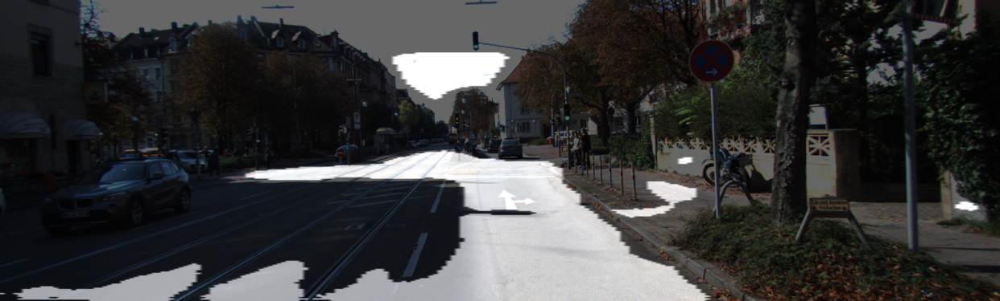

IoU : 0.419641

U-Net++


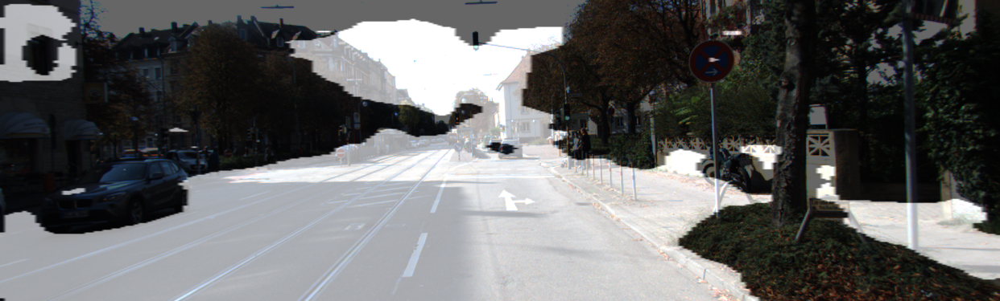

IoU : 0.595302

U-Net


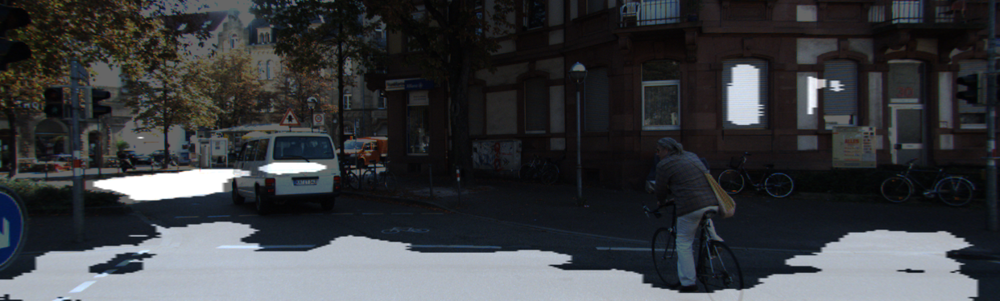

IoU : 0.584087

U-Net++


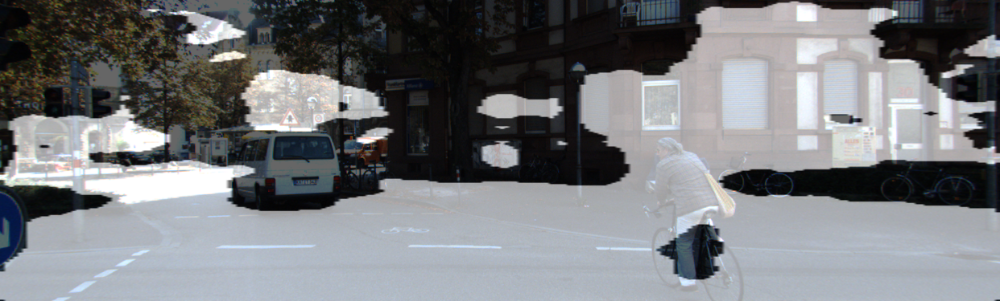

IoU : 0.393248

U-Net


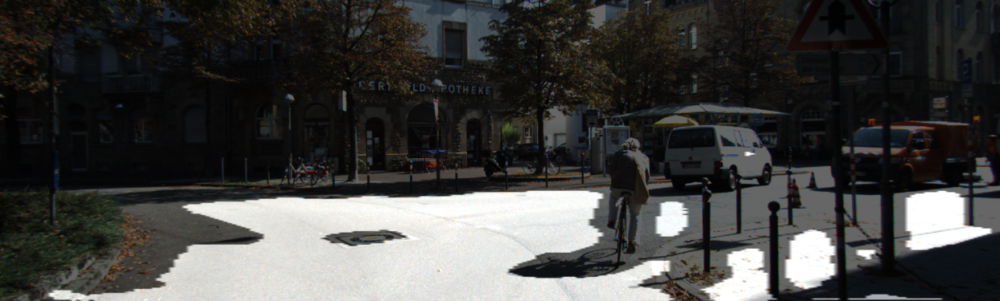

IoU : 0.571212

U-Net++


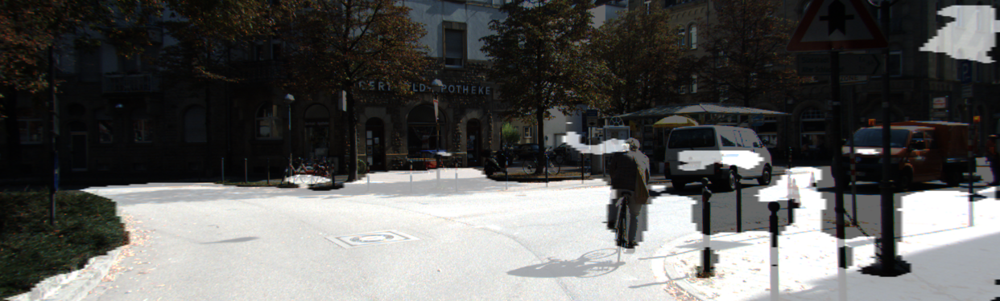

IoU : 0.589786

U-Net


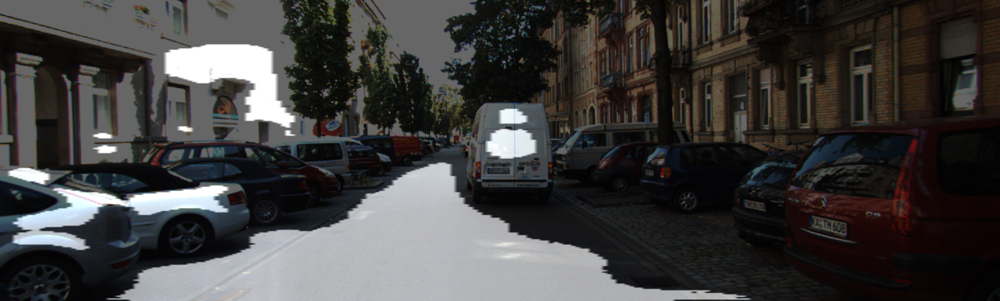

IoU : 0.560296

U-Net++


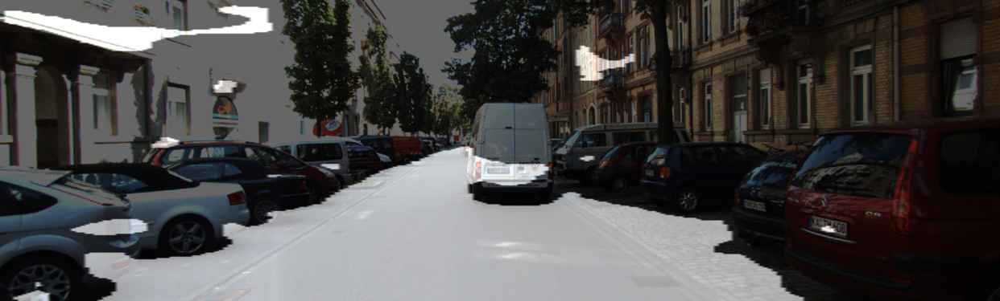

IoU : 0.553790

U-Net


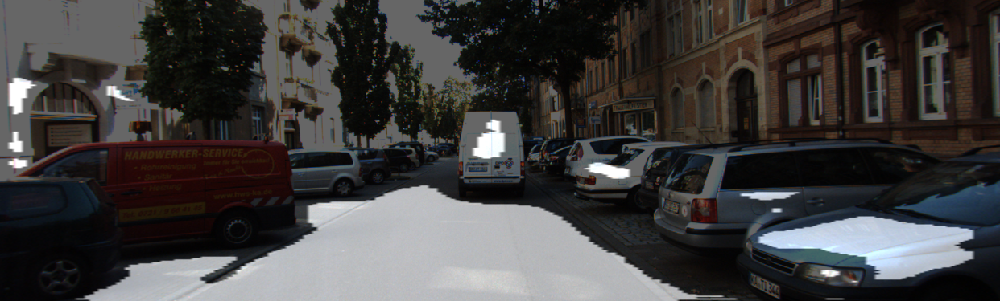

IoU : 0.647032

U-Net++


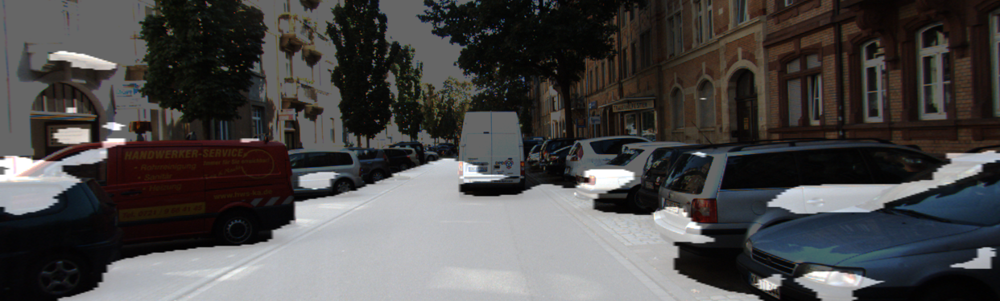

IoU : 0.526011
U-Net: 0.5564535104493024
U-Net++: 0.531627352712219


In [66]:
unet_score_list = []
unetpp_score_list = []
for i in range(1,6):
    print("\nU-Net")
    output, prediction, target = get_output(
         model, 
         test_preproc,
         image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
         output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
         label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
     )
    unet_iou_score = calculate_iou_score(target, prediction)
    unet_score_list.append(unet_iou_score)

    print("\nU-Net++")
    output, prediction, target = get_output(
         model2, 
         test_preproc,
         image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
         output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
         label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
     )
    unetpp_iou_score = calculate_iou_score(target, prediction)
    unetpp_score_list.append(unetpp_iou_score)
print("U-Net:", np.mean(unet_score_list))
print("U-Net++:", np.mean(unetpp_score_list))

평균적으로 UNet이 더 잘나오는데 이유가 뭘까요..